In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 104.3 MB/s eta 0:00:00


In [3]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cv2
import json
from PIL import Image
import os
import torch
import torch.nn as nn
import torch.nn.functional as F

In [4]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [5]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [6]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.transforms import ToTensor

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    ToTensorV2()
])

test_transform = A.Compose([
    ToTensorV2()
])

val_transform = A.Compose([
    ToTensorV2()
])

def remove_outliers_img(image_array, lower_value = 1, upper_value = 99):
    stretched = np.zeros_like(image_array, dtype = np.float32)

    for i in range(image_array.shape[2]):
        band = image_array[:, :, i].astype(np.float32)
        lower_limit = np.percentile(band, lower_value)
        upper_limit = np.percentile(band, upper_value)

        if upper_limit - lower_limit < 1e-6:
            stretched[:, :, i] = band
        else:
            stretched[:, :, i] = np.clip((band - lower_limit) / (upper_limit - lower_limit) * 255.0, 0, 255)

    return stretched.astype(np.uint8)

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None, apply_remove_outliers = True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform
        self.apply_remove_outliers = apply_remove_outliers

    def __len__(self):
        return len(self.image_paths)

    def normalize(self, image, mask):
        image = (image - image.min()) / (image.max() - image.min() + 1e-8)
        mask = (mask > 0.5).float()
        return image, mask

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"), dtype = np.float32)
        mask = np.array(Image.open(mask_path).convert("L"), dtype = np.uint8)

        if self.apply_remove_outliers:
            image = remove_outliers_img(image)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image = augmented["image"]
            mask = augmented["mask"]
        else:
            image = torch.tensor(image).permute(2, 0, 1) / 255.0
            mask = torch.tensor(mask)

        mask = (mask > 0.5).float()
        mask = mask.unsqueeze(0).float()

        image, mask = self.normalize(image, mask)

        return image, mask, image_path, mask_path

In [7]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = True)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

In [8]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [9]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[0.0549, 0.1176, 0.0353,  ..., 0.2980, 0.3451, 0.3451],
         [0.0863, 0.0039, 0.0863,  ..., 0.3529, 0.3529, 0.3608],
         [0.0314, 0.0941, 0.0549,  ..., 0.3686, 0.3961, 0.3137],
         ...,
         [0.1176, 0.1451, 0.1373,  ..., 0.4196, 0.4314, 0.4039],
         [0.1843, 0.1373, 0.1137,  ..., 0.5098, 0.5255, 0.4941],
         [0.0549, 0.0157, 0.1216,  ..., 0.5451, 0.5765, 0.5294]],

        [[0.0745, 0.0627, 0.1059,  ..., 0.1490, 0.2314, 0.2118],
         [0.0588, 0.1059, 0.0863,  ..., 0.2039, 0.1490, 0.2275],
         [0.1255, 0.0863, 0.0902,  ..., 0.1608, 0.2275, 0.3098],
         ...,
         [0.2039, 0.1098, 0.1137,  ..., 0.3216, 0.3725, 0.3686],
         [0.1216, 0.1294, 0.1294,  ..., 0.3843, 0.4275, 0.5020],
         [0.0235, 0.0275, 0.1333,  ..., 0.5216, 0.5020, 0.5333]],

        [[0.0078, 0.0706, 0.0667,  ..., 0.2510, 0.2039, 0.2000],
         [0.0706, 0.0980, 0.0549,  ..., 0.2000, 0.2627, 0.2353],
         [0.0471, 0.0000, 0.0627,  ..., 0.2000, 0.2235, 0.

In [10]:
print(mask_train)
print(mask_train.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [11]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[0.1529, 0.1216, 0.1176,  ..., 0.3804, 0.4588, 0.1725],
         [0.2392, 0.2118, 0.1922,  ..., 0.2941, 0.2745, 0.1333],
         [0.2745, 0.2549, 0.2314,  ..., 0.1059, 0.1412, 0.2353],
         ...,
         [0.7961, 0.8000, 0.8118,  ..., 0.2706, 0.2588, 0.0863],
         [0.7961, 0.8000, 0.8039,  ..., 0.0667, 0.0627, 0.1020],
         [0.7882, 0.7961, 0.8000,  ..., 0.0392, 0.0000, 0.0627]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3490, 0.4431, 0.1412],
         [0.2078, 0.1765, 0.1569,  ..., 0.2745, 0.2510, 0.1098],
         [0.2510, 0.2275, 0.2039,  ..., 0.0824, 0.1176, 0.2353],
         ...,
         [0.7765, 0.7843, 0.7922,  ..., 0.2667, 0.2549, 0.0706],
         [0.7765, 0.7843, 0.7882,  ..., 0.0510, 0.0392, 0.0824],
         [0.7725, 0.7765, 0.7843,  ..., 0.0196, 0.0000, 0.0392]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3961, 0.5020, 0.1922],
         [0.2078, 0.1765, 0.1569,  ..., 0.3137, 0.3059, 0.1569],
         [0.2353, 0.2157, 0.1882,  ..., 0.1216, 0.1686, 0.

In [12]:
print(mask_test)
print(mask_test.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [13]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[0.4314, 0.3490, 0.3098,  ..., 0.1608, 0.2431, 0.2510],
         [0.3333, 0.4000, 0.2275,  ..., 0.1490, 0.1686, 0.1333],
         [0.3490, 0.4980, 0.2980,  ..., 0.2157, 0.1922, 0.1490],
         ...,
         [0.2078, 0.2157, 0.2078,  ..., 0.3804, 0.4980, 0.3922],
         [0.1922, 0.2078, 0.2078,  ..., 0.5725, 0.5216, 0.4549],
         [0.1843, 0.2000, 0.2078,  ..., 0.3843, 0.5294, 0.5490]],

        [[0.4235, 0.3294, 0.2784,  ..., 0.1843, 0.2784, 0.2863],
         [0.3098, 0.3882, 0.1843,  ..., 0.1686, 0.1922, 0.1490],
         [0.3294, 0.4980, 0.2706,  ..., 0.2431, 0.2196, 0.1686],
         ...,
         [0.2275, 0.2353, 0.2275,  ..., 0.4118, 0.5059, 0.3882],
         [0.2118, 0.2275, 0.2275,  ..., 0.6353, 0.5333, 0.4549],
         [0.2000, 0.2196, 0.2275,  ..., 0.4235, 0.5412, 0.5647]],

        [[0.4078, 0.3098, 0.2431,  ..., 0.1882, 0.2863, 0.2941],
         [0.2941, 0.3725, 0.1451,  ..., 0.1725, 0.2000, 0.1529],
         [0.3098, 0.4863, 0.2510,  ..., 0.2510, 0.2235, 0.

In [14]:
print(mask_val)
print(mask_val.shape)

tensor([[[0., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 0., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
torch.Size([1, 256, 256])


In [15]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [19]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [20]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [21]:
for image, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [22]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        bce_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction = "none")
        pt = torch.exp(-bce_loss)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce_loss).mean()

        probs = torch.sigmoid(inputs)
        probs = probs.contiguous().view(probs.shape[0], -1)
        targets = targets.contiguous().view(targets.shape[0], -1)

        intersection = (probs * targets).sum(dim = 1)
        dice_score = (2.0 * intersection + smooth) / (probs.sum(dim = 1) + targets.sum(dim = 1) + smooth)
        dice_loss = 1 - dice_score.mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [23]:
def calc_iou(pred_mask, gt_mask, smooth = 1e-6):
    pred_mask = torch.sigmoid(pred_mask.detach())
    pred_mask = (pred_mask > 0.5).float()

    gt_mask = (gt_mask.detach() > 0).float()

    if pred_mask.dim() == 3:
        pred_mask = pred_mask.unsqueeze(1)
    if gt_mask.dim() == 3:
        gt_mask = gt_mask.unsqueeze(1)

    batch_size = pred_mask.shape[0]
    iou_list = []

    for i in range(batch_size):
        gt = gt_mask[i]
        pred = pred_mask[i]

        intersect = (pred * gt).sum()
        union = pred.sum() + gt.sum() - intersect

        if gt.sum() == 0:
            if pred.sum() == 0:
                iou = 1.0
            else:
                iou = 0.0
        else:
            iou = (intersect + smooth) / (union + smooth)

        iou_list.append(iou)

    return torch.tensor(iou_list).mean().item()

In [24]:
!pip install transformers datasets accelerate timm

In [25]:
from transformers import SegformerFeatureExtractor, SegformerForSemanticSegmentation

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b5-finetuned-ade-640-640",
    num_labels = 2,
    ignore_mismatched_sizes = True
).to(device)

for param in model.segformer.encoder.parameters():
    param.requires_grad = False

for param in model.segformer.encoder.block[3].parameters():
    param.requires_grad = True

for m in model.modules():
    if isinstance(m, nn.BatchNorm2d):
        for param in m.parameters():
            param.requires_grad = True

trainable_params = [p for p in model.parameters() if p.requires_grad]
print(f"Trainable parameters: {sum(p.numel() for p in trainable_params)}")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/339M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/339M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trainable parameters: 12670466


In [26]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 9.5 MB/s eta 0:00:00


In [45]:
import torch.optim as optim
from tqdm import tqdm
import warnings
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR
import optuna

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)

    optimizer = optim.AdamW([
        {"params": model.segformer.encoder.block[-1].parameters(), "lr": 0.0001},
        {"params": model.decode_head.parameters(), "lr": 0.0001}
    ])

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):

        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, _, _ in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(pixel_values = images)
            logits = outputs.logits

            logits = torch.nn.functional.interpolate(
                logits, size = masks.shape[2:], mode = "bilinear", align_corners = False
            )

            logits = logits[:, 1:2, :, :]
            loss = loss_func(logits, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(logits, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch + 1}/{num_epoch}")
        print(f"Train Loss: {avg_loss}, Train Avg IoU: {avg_iou}")

        model.eval()
        val_loss = 0
        val_iou = 0

        with torch.no_grad():
            for val_images, val_masks, _, _ in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                outputs = model(pixel_values=val_images)
                logits = outputs.logits
                logits = torch.nn.functional.interpolate(
                    logits, size = val_masks.shape[2:], mode = "bilinear", align_corners = False
                )
                logits = logits[:, 1:2, :, :]
                loss = loss_func(logits, val_masks.float())
                val_loss += loss.item()
                val_iou += calc_iou(logits, val_masks)

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val Loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1
        if trigger >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [46]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(0.3, 0.7), (0.2, 0.8), (0.1, 0.9), (0.0, 1.0)])

    model = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/segformer-b5-finetuned-ade-640-640",
        num_labels = 2,
        ignore_mismatched_sizes = True
    )

    for param in model.segformer.encoder.parameters():
        param.requires_grad = False

    for param in model.segformer.encoder.block[3].parameters():
        param.requires_grad = True

    for m in model.modules():
        if isinstance(m, nn.BatchNorm2d):
            for param in m.parameters():
                param.requires_grad = True

    def batchnorm_to_groupnorm(model, num_groups = 32):
        for name, module in list(model.named_children()):
            if isinstance(module, nn.BatchNorm2d):
                num_features = module.num_features
                valid_num_groups = min(num_groups, num_features)
                while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                    valid_num_groups -= 1
                new_module = nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features)
                setattr(model, name, new_module)
            else:
                batchnorm_to_groupnorm(module, num_groups)
        return model

    model = batchnorm_to_groupnorm(model)
    model = model.to(device)

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    best_model, val_loss = train_model(
        model = model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = best_model

    return val_loss

In [47]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.3, 0.7)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-15 17:30:23,172] A new study created in memory with name: no-name-085f1324-78b8-49b7-8ae1-129169dab0fd
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 0: scheduler = cosine, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [00:16<00:00,  8.98it/s]


Epoch 1/25
Train Loss: 0.14607715811063018, Train Avg IoU: 0.5970893040017994


100%|██████████| 18/18 [00:01<00:00, 12.51it/s]


Val Loss: 0.11729853020773993, Val Avg IoU: 0.6815695406662093



100%|██████████| 144/144 [00:15<00:00,  9.18it/s]


Epoch 2/25
Train Loss: 0.10769875826210612, Train Avg IoU: 0.711136733886734


100%|██████████| 18/18 [00:01<00:00, 12.15it/s]


Val Loss: 0.1012417750640048, Val Avg IoU: 0.7052058693435457



100%|██████████| 144/144 [00:16<00:00,  8.73it/s]


Epoch 3/25
Train Loss: 0.09621473620387001, Train Avg IoU: 0.7400845143840544


100%|██████████| 18/18 [00:01<00:00, 11.89it/s]


Val Loss: 0.0932740858859486, Val Avg IoU: 0.7334006743298637



100%|██████████| 144/144 [00:15<00:00,  9.14it/s]


Epoch 4/25
Train Loss: 0.08987011450032394, Train Avg IoU: 0.7505833671117822


100%|██████████| 18/18 [00:01<00:00, 11.51it/s]


Val Loss: 0.08711035797993343, Val Avg IoU: 0.7517734815677007



100%|██████████| 144/144 [00:15<00:00,  9.18it/s]


Epoch 5/25
Train Loss: 0.08371897914912552, Train Avg IoU: 0.7746404082410865


100%|██████████| 18/18 [00:01<00:00, 12.67it/s]


Val Loss: 0.08733908914857441, Val Avg IoU: 0.743912042842971



100%|██████████| 144/144 [00:16<00:00,  8.82it/s]


Epoch 6/25
Train Loss: 0.07969690393656492, Train Avg IoU: 0.7838759854849842


100%|██████████| 18/18 [00:01<00:00, 10.74it/s]


Val Loss: 0.08532952393094699, Val Avg IoU: 0.7500818537341224



100%|██████████| 144/144 [00:15<00:00,  9.19it/s]


Epoch 7/25
Train Loss: 0.07875648769550025, Train Avg IoU: 0.7768225394603279


100%|██████████| 18/18 [00:01<00:00, 12.65it/s]


Val Loss: 0.08046392868790361, Val Avg IoU: 0.7561700261301465



100%|██████████| 144/144 [00:15<00:00,  9.13it/s]


Epoch 8/25
Train Loss: 0.07496921101119369, Train Avg IoU: 0.786320634600189


100%|██████████| 18/18 [00:01<00:00, 12.64it/s]


Val Loss: 0.0788193338861068, Val Avg IoU: 0.7618184768491321



100%|██████████| 144/144 [00:16<00:00,  8.90it/s]


Epoch 9/25
Train Loss: 0.07415937381382617, Train Avg IoU: 0.7880919277667999


100%|██████████| 18/18 [00:01<00:00,  9.26it/s]


Val Loss: 0.08567063386241595, Val Avg IoU: 0.7475324869155884



100%|██████████| 144/144 [00:15<00:00,  9.16it/s]


Epoch 10/25
Train Loss: 0.07380009513710523, Train Avg IoU: 0.7928445469588041


100%|██████████| 18/18 [00:01<00:00, 12.49it/s]


Val Loss: 0.07639287557038996, Val Avg IoU: 0.770031021700965



100%|██████████| 144/144 [00:15<00:00,  9.15it/s]


Epoch 11/25
Train Loss: 0.07105222685883443, Train Avg IoU: 0.7941707637574937


100%|██████████| 18/18 [00:01<00:00, 12.48it/s]


Val Loss: 0.07747713497115506, Val Avg IoU: 0.7629389564196268



100%|██████████| 144/144 [00:16<00:00,  8.92it/s]


Epoch 12/25
Train Loss: 0.07194570794753316, Train Avg IoU: 0.789816846864091


100%|██████████| 18/18 [00:01<00:00,  9.06it/s]


Val Loss: 0.07797066846655475, Val Avg IoU: 0.7596523116032282



100%|██████████| 144/144 [00:15<00:00,  9.20it/s]


Epoch 13/25
Train Loss: 0.07262832578271627, Train Avg IoU: 0.7907595059110059


100%|██████████| 18/18 [00:01<00:00, 12.42it/s]


Val Loss: 0.08043092116713524, Val Avg IoU: 0.7533573624160554



100%|██████████| 144/144 [00:15<00:00,  9.22it/s]


Epoch 14/25
Train Loss: 0.06971229438204318, Train Avg IoU: 0.7980045133994685


100%|██████████| 18/18 [00:01<00:00, 12.51it/s]


Val Loss: 0.08119113970961836, Val Avg IoU: 0.7525644749403



100%|██████████| 144/144 [00:15<00:00,  9.04it/s]


Epoch 15/25
Train Loss: 0.06956114365150118, Train Avg IoU: 0.8027233979147341


100%|██████████| 18/18 [00:02<00:00,  8.74it/s]


Val Loss: 0.07845095151828395, Val Avg IoU: 0.7602465516991086



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 16/25
Train Loss: 0.06930286518116999, Train Avg IoU: 0.798470886838105


100%|██████████| 18/18 [00:01<00:00, 12.21it/s]


Val Loss: 0.08026684406730863, Val Avg IoU: 0.7556623054875268



100%|██████████| 144/144 [00:15<00:00,  9.20it/s]


Epoch 17/25
Train Loss: 0.06761141587048769, Train Avg IoU: 0.8071673061284754


100%|██████████| 18/18 [00:01<00:00, 12.52it/s]


Val Loss: 0.08018548289934795, Val Avg IoU: 0.7568771044413248



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 18/25
Train Loss: 0.06754569426023711, Train Avg IoU: 0.8027861225936148


100%|██████████| 18/18 [00:02<00:00,  8.84it/s]


Val Loss: 0.07866494398978022, Val Avg IoU: 0.7578282703955969



100%|██████████| 144/144 [00:15<00:00,  9.05it/s]


Epoch 19/25
Train Loss: 0.06862539946127476, Train Avg IoU: 0.7977169911480613


100%|██████████| 18/18 [00:01<00:00, 12.44it/s]


Val Loss: 0.07741191714174217, Val Avg IoU: 0.7618289093176523



100%|██████████| 144/144 [00:15<00:00,  9.16it/s]


Epoch 20/25
Train Loss: 0.06646986076116769, Train Avg IoU: 0.8050229967468314


100%|██████████| 18/18 [00:01<00:00, 12.63it/s]
[I 2025-11-15 17:36:14,139] Trial 0 finished with value: 0.07639287557038996 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.07639287557038996.


Val Loss: 0.07940465708573659, Val Avg IoU: 0.756917867395613

Early stopping at epoch 20


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 1: scheduler = reducelr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [00:16<00:00,  8.90it/s]


Epoch 1/25
Train Loss: 0.1433400295726541, Train Avg IoU: 0.5991466826774628


100%|██████████| 18/18 [00:01<00:00,  9.18it/s]


Val Loss: 0.11866603646841314, Val Avg IoU: 0.6488040315194262



100%|██████████| 144/144 [00:15<00:00,  9.13it/s]


Epoch 2/25
Train Loss: 0.10571771363417308, Train Avg IoU: 0.7218720932594604


100%|██████████| 18/18 [00:01<00:00, 12.63it/s]


Val Loss: 0.10308457165956497, Val Avg IoU: 0.7008864482243856



100%|██████████| 144/144 [00:15<00:00,  9.19it/s]


Epoch 3/25
Train Loss: 0.09684581380699658, Train Avg IoU: 0.7352469362732437


100%|██████████| 18/18 [00:01<00:00, 12.48it/s]


Val Loss: 0.0923735700133774, Val Avg IoU: 0.7327042784955766



100%|██████████| 144/144 [00:15<00:00,  9.01it/s]


Epoch 4/25
Train Loss: 0.08863426197785884, Train Avg IoU: 0.7597672537797027


100%|██████████| 18/18 [00:01<00:00,  9.12it/s]


Val Loss: 0.08490434516635206, Val Avg IoU: 0.7601457768016391



100%|██████████| 144/144 [00:15<00:00,  9.13it/s]


Epoch 5/25
Train Loss: 0.08291731413919479, Train Avg IoU: 0.7665370053922137


100%|██████████| 18/18 [00:01<00:00, 12.10it/s]


Val Loss: 0.08439707073072593, Val Avg IoU: 0.7513911177714666



100%|██████████| 144/144 [00:15<00:00,  9.18it/s]


Epoch 6/25
Train Loss: 0.08004871833448608, Train Avg IoU: 0.7716161927415265


100%|██████████| 18/18 [00:01<00:00, 12.53it/s]


Val Loss: 0.08476981769005458, Val Avg IoU: 0.7540563129716449



100%|██████████| 144/144 [00:15<00:00,  9.06it/s]


Epoch 7/25
Train Loss: 0.07716408122279164, Train Avg IoU: 0.7788469122929705


100%|██████████| 18/18 [00:01<00:00,  9.03it/s]


Val Loss: 0.08133341848022407, Val Avg IoU: 0.756782955593533



100%|██████████| 144/144 [00:15<00:00,  9.01it/s]


Epoch 8/25
Train Loss: 0.07560818228456709, Train Avg IoU: 0.783839724957943


100%|██████████| 18/18 [00:01<00:00, 12.51it/s]


Val Loss: 0.08085995353758335, Val Avg IoU: 0.7556745327181287



100%|██████████| 144/144 [00:15<00:00,  9.14it/s]


Epoch 9/25
Train Loss: 0.07341626413916755, Train Avg IoU: 0.7877354471840792


100%|██████████| 18/18 [00:01<00:00, 12.63it/s]


Val Loss: 0.07687830076449448, Val Avg IoU: 0.7702493319908778



100%|██████████| 144/144 [00:15<00:00,  9.11it/s]


Epoch 10/25
Train Loss: 0.07170588809013781, Train Avg IoU: 0.7951524648815393


100%|██████████| 18/18 [00:02<00:00,  8.99it/s]


Val Loss: 0.07754224869940016, Val Avg IoU: 0.7674949235386319



100%|██████████| 144/144 [00:15<00:00,  9.06it/s]


Epoch 11/25
Train Loss: 0.07123562495043087, Train Avg IoU: 0.7936238112548987


100%|██████████| 18/18 [00:01<00:00, 12.58it/s]


Val Loss: 0.07407758736775981, Val Avg IoU: 0.779718107647366



100%|██████████| 144/144 [00:15<00:00,  9.21it/s]


Epoch 12/25
Train Loss: 0.06942013647252072, Train Avg IoU: 0.8033510719736418


100%|██████████| 18/18 [00:01<00:00, 12.70it/s]


Val Loss: 0.07506646940277682, Val Avg IoU: 0.7663071933719847



100%|██████████| 144/144 [00:15<00:00,  9.26it/s]


Epoch 13/25
Train Loss: 0.07078983698738739, Train Avg IoU: 0.7931616264912817


100%|██████████| 18/18 [00:01<00:00,  9.78it/s]


Val Loss: 0.0704155040697919, Val Avg IoU: 0.7889958189593421



100%|██████████| 144/144 [00:16<00:00,  8.90it/s]


Epoch 14/25
Train Loss: 0.06831177652606533, Train Avg IoU: 0.8052240686698092


100%|██████████| 18/18 [00:01<00:00, 12.62it/s]


Val Loss: 0.07573268252114455, Val Avg IoU: 0.7694879952404234



100%|██████████| 144/144 [00:15<00:00,  9.18it/s]


Epoch 15/25
Train Loss: 0.06857509053467463, Train Avg IoU: 0.7995769886506928


100%|██████████| 18/18 [00:01<00:00, 12.53it/s]


Val Loss: 0.07307636634343201, Val Avg IoU: 0.776556059718132



100%|██████████| 144/144 [00:15<00:00,  9.29it/s]


Epoch 16/25
Train Loss: 0.06795703240075252, Train Avg IoU: 0.7979492222269376


100%|██████████| 18/18 [00:01<00:00, 11.84it/s]


Val Loss: 0.07443534831206004, Val Avg IoU: 0.7705653773413764



100%|██████████| 144/144 [00:16<00:00,  8.75it/s]


Epoch 17/25
Train Loss: 0.06730487443403238, Train Avg IoU: 0.8015196600721942


100%|██████████| 18/18 [00:01<00:00, 12.31it/s]


Val Loss: 0.07376694555083911, Val Avg IoU: 0.7755333334207535



100%|██████████| 144/144 [00:15<00:00,  9.27it/s]


Epoch 18/25
Train Loss: 0.0652349052963675, Train Avg IoU: 0.8049003090709448


100%|██████████| 18/18 [00:01<00:00, 12.69it/s]


Val Loss: 0.07389682738317384, Val Avg IoU: 0.7774654924869537



100%|██████████| 144/144 [00:15<00:00,  9.19it/s]


Epoch 19/25
Train Loss: 0.06519394678374131, Train Avg IoU: 0.8066597059369087


100%|██████████| 18/18 [00:01<00:00, 12.50it/s]


Val Loss: 0.07186592121918996, Val Avg IoU: 0.779657158586714



100%|██████████| 144/144 [00:16<00:00,  8.88it/s]


Epoch 20/25
Train Loss: 0.0664919535888152, Train Avg IoU: 0.8026479714446597


100%|██████████| 18/18 [00:01<00:00, 10.68it/s]


Val Loss: 0.07448922615084383, Val Avg IoU: 0.7719953507184982



100%|██████████| 144/144 [00:15<00:00,  9.23it/s]


Epoch 21/25
Train Loss: 0.06352473978121351, Train Avg IoU: 0.8173462324258354


100%|██████████| 18/18 [00:01<00:00, 12.59it/s]


Val Loss: 0.07489496966203053, Val Avg IoU: 0.76825327012274



100%|██████████| 144/144 [00:15<00:00,  9.23it/s]


Epoch 22/25
Train Loss: 0.06264206035605942, Train Avg IoU: 0.8096896761821376


100%|██████████| 18/18 [00:01<00:00, 12.44it/s]


Val Loss: 0.07889019966953331, Val Avg IoU: 0.7576151788234711



100%|██████████| 144/144 [00:16<00:00,  8.88it/s]


Epoch 23/25
Train Loss: 0.06304772284218213, Train Avg IoU: 0.810907454126411


100%|██████████| 18/18 [00:01<00:00, 10.07it/s]
[I 2025-11-15 17:42:56,772] Trial 1 finished with value: 0.0704155040697919 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.3, 0.7)}. Best is trial 1 with value: 0.0704155040697919.


Val Loss: 0.07814392302599218, Val Avg IoU: 0.7588765505287383

Early stopping at epoch 23


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 2: scheduler = steplr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [00:15<00:00,  9.06it/s]


Epoch 1/25
Train Loss: 0.14086016383953393, Train Avg IoU: 0.6245190453547467


100%|██████████| 18/18 [00:01<00:00, 12.53it/s]


Val Loss: 0.11646032974951798, Val Avg IoU: 0.6786320995953348



100%|██████████| 144/144 [00:15<00:00,  9.14it/s]


Epoch 2/25
Train Loss: 0.10780837549827993, Train Avg IoU: 0.7173553070234548


100%|██████████| 18/18 [00:01<00:00, 10.60it/s]


Val Loss: 0.09990433520740932, Val Avg IoU: 0.7197311247388521



100%|██████████| 144/144 [00:16<00:00,  8.68it/s]


Epoch 3/25
Train Loss: 0.09695577801256958, Train Avg IoU: 0.7404205541436871


100%|██████████| 18/18 [00:01<00:00, 12.51it/s]


Val Loss: 0.09212456581493218, Val Avg IoU: 0.7339323651459482



100%|██████████| 144/144 [00:15<00:00,  9.09it/s]


Epoch 4/25
Train Loss: 0.09054038576626529, Train Avg IoU: 0.7472994629707601


100%|██████████| 18/18 [00:01<00:00, 12.42it/s]


Val Loss: 0.08666383516457346, Val Avg IoU: 0.7464329633447859



100%|██████████| 144/144 [00:15<00:00,  9.18it/s]


Epoch 5/25
Train Loss: 0.08443903123002706, Train Avg IoU: 0.7646248941827152


100%|██████████| 18/18 [00:01<00:00, 11.40it/s]


Val Loss: 0.08321201884084278, Val Avg IoU: 0.756426688697603



100%|██████████| 144/144 [00:16<00:00,  8.71it/s]


Epoch 6/25
Train Loss: 0.07988341342813025, Train Avg IoU: 0.7754538384162717


100%|██████████| 18/18 [00:01<00:00, 12.74it/s]


Val Loss: 0.0825190469622612, Val Avg IoU: 0.7560103916459613



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 7/25
Train Loss: 0.07799582506736948, Train Avg IoU: 0.778056246538957


100%|██████████| 18/18 [00:01<00:00, 12.19it/s]


Val Loss: 0.08061514712042278, Val Avg IoU: 0.759944862789578



100%|██████████| 144/144 [00:15<00:00,  9.04it/s]


Epoch 8/25
Train Loss: 0.07667778151678956, Train Avg IoU: 0.7793940599593852


100%|██████████| 18/18 [00:01<00:00, 11.23it/s]


Val Loss: 0.07889454480674532, Val Avg IoU: 0.7648012025488747



100%|██████████| 144/144 [00:16<00:00,  8.81it/s]


Epoch 9/25
Train Loss: 0.07564174100601424, Train Avg IoU: 0.783818636710445


100%|██████████| 18/18 [00:01<00:00, 12.03it/s]


Val Loss: 0.07928360191484292, Val Avg IoU: 0.7635337875949012



100%|██████████| 144/144 [00:15<00:00,  9.14it/s]


Epoch 10/25
Train Loss: 0.0749623903991758, Train Avg IoU: 0.7844691851900684


100%|██████████| 18/18 [00:01<00:00, 12.49it/s]


Val Loss: 0.07785773649811745, Val Avg IoU: 0.7654502689838409



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 11/25
Train Loss: 0.07400064401897705, Train Avg IoU: 0.7894895850784249


100%|██████████| 18/18 [00:01<00:00, 12.36it/s]


Val Loss: 0.07924679418404897, Val Avg IoU: 0.7580643163786994



100%|██████████| 144/144 [00:16<00:00,  8.68it/s]


Epoch 12/25
Train Loss: 0.07182956801261753, Train Avg IoU: 0.7906309576291177


100%|██████████| 18/18 [00:01<00:00, 12.48it/s]


Val Loss: 0.07833554885453647, Val Avg IoU: 0.7615693310896555



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 13/25
Train Loss: 0.07171734321552019, Train Avg IoU: 0.8000392816546891


100%|██████████| 18/18 [00:01<00:00, 12.29it/s]


Val Loss: 0.07827091941403018, Val Avg IoU: 0.7619893981350793



100%|██████████| 144/144 [00:15<00:00,  9.16it/s]


Epoch 14/25
Train Loss: 0.0713683610342236, Train Avg IoU: 0.7924189627584484


100%|██████████| 18/18 [00:01<00:00, 12.45it/s]


Val Loss: 0.07913803205721909, Val Avg IoU: 0.7598107225365109



100%|██████████| 144/144 [00:16<00:00,  8.61it/s]


Epoch 15/25
Train Loss: 0.07185457759381582, Train Avg IoU: 0.7903674209697379


100%|██████████| 18/18 [00:01<00:00, 11.69it/s]


Val Loss: 0.07804088604946931, Val Avg IoU: 0.763258707192209



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 16/25
Train Loss: 0.07015632658860543, Train Avg IoU: 0.7946953556189934


100%|██████████| 18/18 [00:01<00:00, 12.49it/s]


Val Loss: 0.07912728894088003, Val Avg IoU: 0.7594107124540541



100%|██████████| 144/144 [00:15<00:00,  9.06it/s]


Epoch 17/25
Train Loss: 0.0700764268468548, Train Avg IoU: 0.7945127501669857


100%|██████████| 18/18 [00:01<00:00, 12.63it/s]


Val Loss: 0.07980847131046984, Val Avg IoU: 0.7576795534955131



100%|██████████| 144/144 [00:16<00:00,  8.61it/s]


Epoch 18/25
Train Loss: 0.06866997604568799, Train Avg IoU: 0.7992363458292352


100%|██████████| 18/18 [00:01<00:00, 12.45it/s]


Val Loss: 0.08009708817634317, Val Avg IoU: 0.7569258676634895



100%|██████████| 144/144 [00:15<00:00,  9.14it/s]


Epoch 19/25
Train Loss: 0.06919915571860555, Train Avg IoU: 0.7983944784435961


100%|██████████| 18/18 [00:01<00:00, 12.38it/s]


Val Loss: 0.07964081772499615, Val Avg IoU: 0.75809113184611



100%|██████████| 144/144 [00:16<00:00,  8.99it/s]


Epoch 20/25
Train Loss: 0.06949637199674423, Train Avg IoU: 0.7966517137570513


100%|██████████| 18/18 [00:01<00:00, 12.31it/s]
[I 2025-11-15 17:48:49,675] Trial 2 finished with value: 0.07785773649811745 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.3, 0.7)}. Best is trial 1 with value: 0.0704155040697919.


Val Loss: 0.07970757865243489, Val Avg IoU: 0.7592384633090761

Early stopping at epoch 20


In [48]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (0.3, 0.7)}
Best val loss: 0.0704155040697919


In [49]:
fine_tune_model.eval()

SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (encoder): SegformerEncoder(
      (patch_embeddings): ModuleList(
        (0): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (1): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        )
        (2): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
        )
        (3): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)

In [50]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        if intersection == 0:
            return 1.0
        else:
            return 0.0
    else:
        iou = intersection / union
        return iou

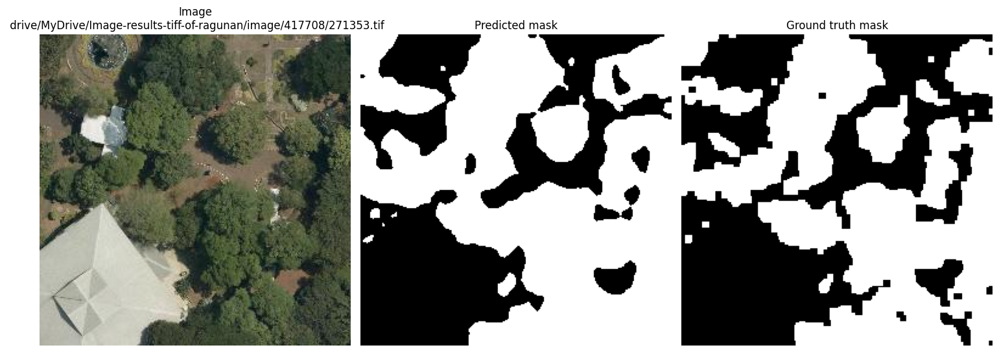

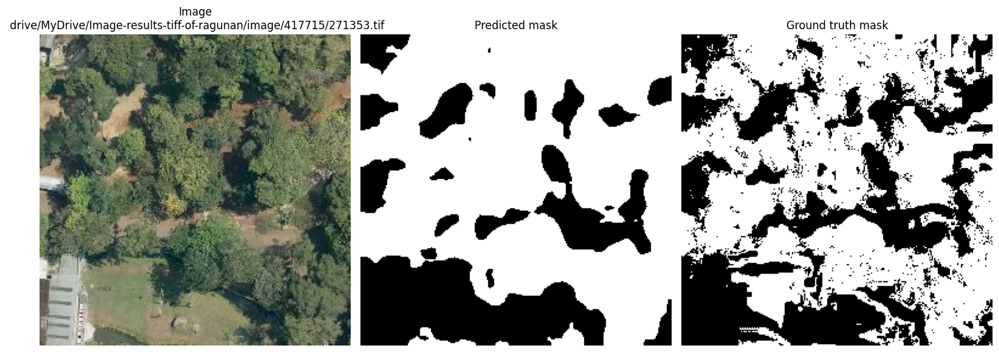

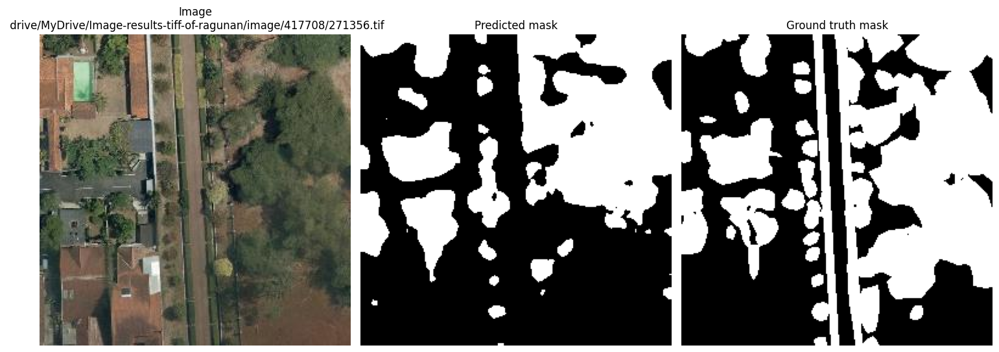

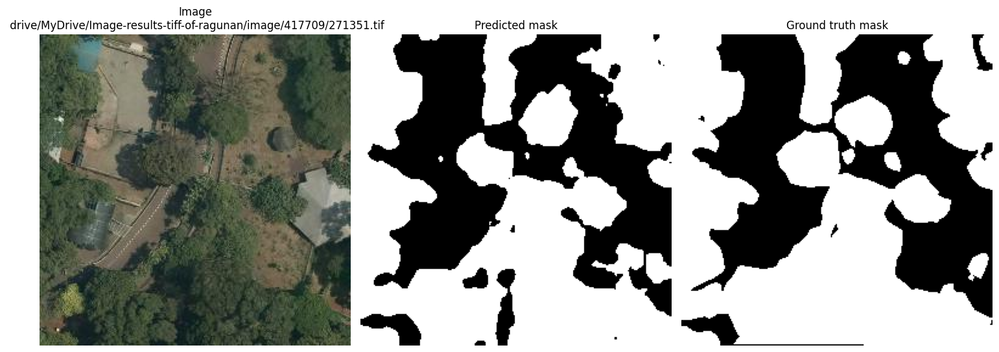

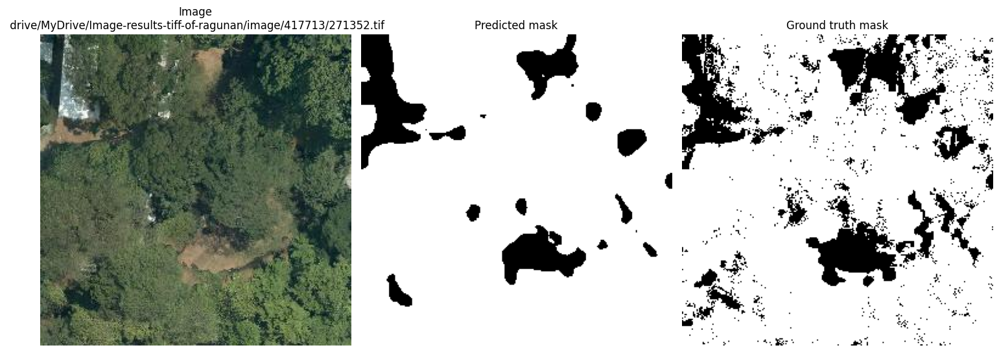

...

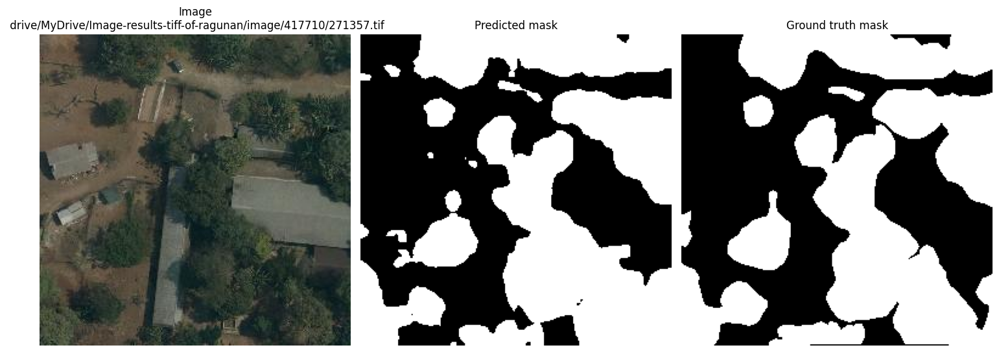

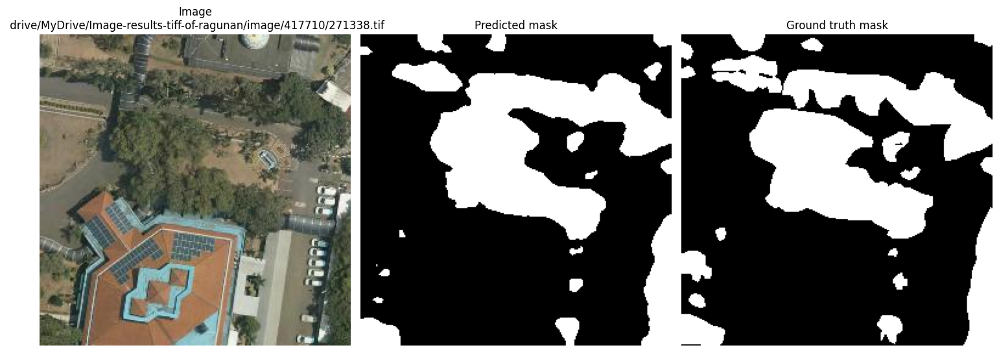

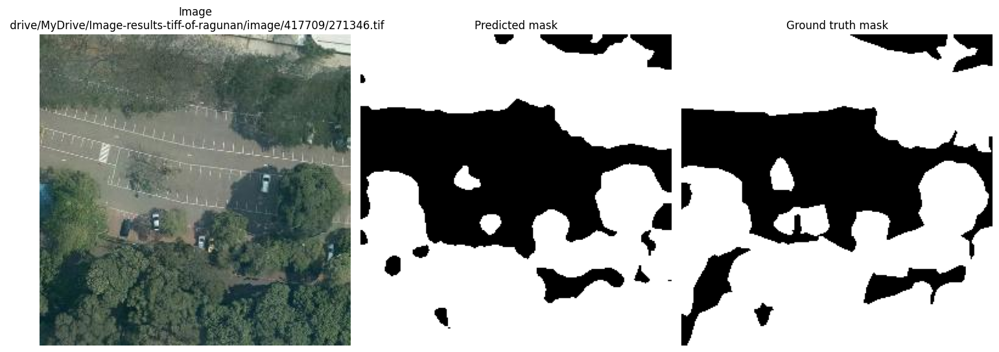

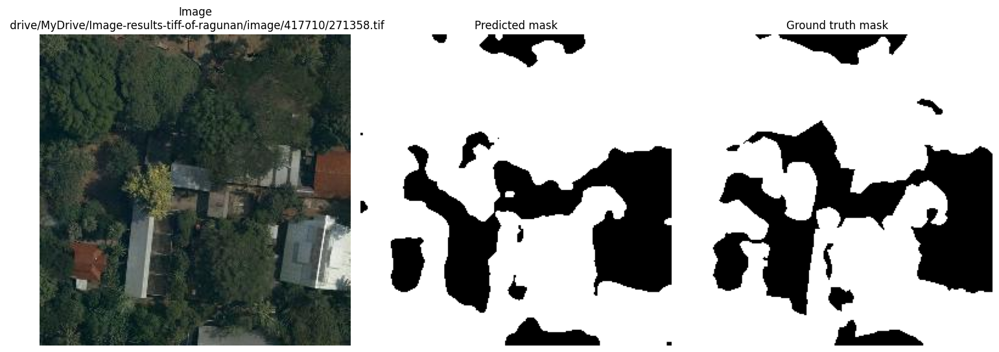

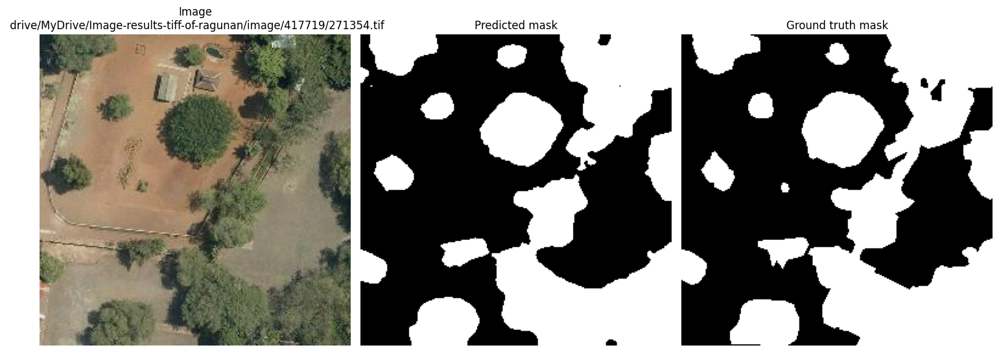

In [51]:
bin_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for images, masks, image_path, mask_path in test_loader:
        images = images.to(device)

        outputs = fine_tune_model(pixel_values = images)
        logits = outputs.logits

        upsampled_logits = F.interpolate(
            logits, size = masks.shape[-2:], mode = "bilinear", align_corners = False
        )

        probs = torch.softmax(upsampled_logits, dim = 1)
        preds = (probs[:, 1, :, :] > 0.5).cpu().numpy().astype(np.uint8) * 255

        for i in range(len(image_path)):
            img_path = image_path[i]
            mask_gt_path = mask_path[i]

            with rasterio.open(img_path) as src:
                img = src.read([1, 2, 3])
                img = np.transpose(img, (1, 2, 0))

            gt_mask = cv2.imread(mask_gt_path, cv2.IMREAD_GRAYSCALE)
            pred_mask = preds[i]

            bin_masks.append(pred_mask)
            gt_masks.append(gt_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(img)
            plt.title(f"Image\n {img_path}")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(pred_mask, cmap="gray")
            plt.title("Predicted mask")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap="gray")
            plt.title("Ground truth mask")
            plt.axis("off")

            plt.tight_layout()
            plt.show()

In [52]:
iou_score = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    bin_mask = bin_masks[i]
    gt_mask = gt_masks[i]

    pixels = np.sum(bin_mask > 0)
    veg_area = pixels * (GSD_x * GSD_y)

    iou = calculate_iou(bin_mask, gt_mask)

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou}")
    print("=========================")

    iou_score.append(iou)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

print("===========================")
print(f"Average IoU score: {np.mean(iou_score)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 39444
Vegetation coverage area: 22200.263086397077
IoU score: 0.8493714400421549
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 45231
Vegetation coverage area: 3514.8073719815275
IoU score: 0.7520768753874768
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 24001
Vegetation coverage area: 13508.480740711295
IoU score: 0.6109758924432082
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 37928
Vegetation coverage area: 21347.012938364984
IoU score: 0.8478847228634607
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 58006


In [62]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 22200.263086397077 m^2
Carbon density: 0.0073651764909151 ton/m^2
Estimated carbon stock: 163.50885577606206 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3514.8073719815275 m^2
Carbon density: 0.0073651764909151 ton/m^2
Estimated carbon stock: 25.88717662621343 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 13508.480740711295 m^2
Carbon density: 0.0073651764909151 ton/m^2
Estimated carbon stock: 99.49234477946624 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 21347.012938364984 m^2
Carbon density: 0.0073651764909151 ton/m^2
Estimated carbon stock: 157.22451784490625 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4507.526174949935 m^2
Carbon density: 0.0073651764